In [26]:
import glob

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import matplotlib
%matplotlib inline

from pylab import rcParams

from utils import METRICS, CONT_PARAMETERS, LOG_PARAMETERS, SET_PARAMETERS, INT_PARAMETERS, read_files,\
    top_mean_dev_auc, top_mean_validation_auc, rolling_min_dev_auc, top_min_whole_validation_auc,\
    top_min_dev_auc, top_min_validation_auc, read_files

In [27]:
rcParams['figure.figsize'] = 20, 5
pd.set_option('display.max_columns', None)

In [3]:
%load_ext autoreload
%autoreload 2

In [4]:
files = ['./experiments/bagging-switch-1.pkl',
         './experiments/bagging-switch-2.pkl']

In [28]:
best_mean_dev = top_mean_dev_auc(read_files(files), 50000)
best_mean_dev.groupby(['file', 'experiment_id']).ngroups

125

In [29]:
best_min_dev = top_min_dev_auc(read_files(files), 50000)
best_min_dev.groupby(['file', 'experiment_id']).ngroups

121

In [30]:
true_best = top_min_whole_validation_auc(read_files(files), 50000)
true_best.groupby(['file', 'experiment_id']).ngroups

123

window = 11 works a bit better than 5, 21, 51, but difference is not really meaningful

In [31]:
rolling_min_dev = rolling_min_dev_auc(read_files(files), 50000, 11)
rolling_min_dev.groupby(['file', 'experiment_id']).ngroups

119

In [32]:
compare_columns = ['mean_dev_auc', 'mean_validation_auc',
               'mean_whole_validation_auc', 'min_dev_auc', 'min_validation_auc', 'min_whole_validation_auc']

In [33]:
best_mean_dev[compare_columns].describe().T

,count,mean,std,min,25%,50%,75%,max
mean_dev_auc,50000.0,0.812833,0.008248,0.803684,0.806062,0.808456,0.819566,0.832576
mean_validation_auc,50000.0,0.793705,0.007498,0.773544,0.787634,0.791904,0.801029,0.810141
mean_whole_validation_auc,50000.0,0.796667,0.008514,0.748238,0.790025,0.796687,0.804421,0.811073
min_dev_auc,50000.0,0.796163,0.014948,0.738322,0.792595,0.795825,0.807039,0.823508
min_validation_auc,50000.0,0.784912,0.018356,0.702412,0.782083,0.788293,0.797472,0.808920
min_whole_validation_auc,50000.0,0.794794,0.010413,0.714739,0.788775,0.794801,0.803333,0.810748


In [34]:
best_mean_dev.min_whole_validation_auc.corr(best_mean_dev.mean_dev_auc, method='spearman')

0.6493043759463902

In [35]:
best_min_dev[compare_columns].describe().T

,count,mean,std,min,25%,50%,75%,max
mean_dev_auc,50000.0,0.811707,0.009047,0.795503,0.804351,0.807556,0.819566,0.832576
mean_validation_auc,50000.0,0.792730,0.008324,0.773740,0.786000,0.791145,0.801029,0.810141
mean_whole_validation_auc,50000.0,0.793104,0.010221,0.735115,0.787228,0.792799,0.801121,0.811073
min_dev_auc,50000.0,0.799939,0.008610,0.789930,0.793393,0.795890,0.807039,0.823508
min_validation_auc,50000.0,0.789259,0.009162,0.763962,0.782570,0.787946,0.797472,0.808920
min_whole_validation_auc,50000.0,0.791225,0.011722,0.714739,0.785417,0.791023,0.799561,0.810748


In [36]:
best_mean_dev.min_whole_validation_auc.corr(best_min_dev.min_dev_auc, method='spearman')

0.6215246409550952

In [37]:
true_best[compare_columns].describe().T

,count,mean,std,min,25%,50%,75%,max
mean_dev_auc,50000.0,0.804433,0.027484,0.500000,0.798503,0.807461,0.819354,0.832576
mean_validation_auc,50000.0,0.785252,0.025795,0.500000,0.777954,0.790450,0.800965,0.810141
mean_whole_validation_auc,50000.0,0.802094,0.004507,0.791687,0.798803,0.802966,0.805587,0.811073
min_dev_auc,50000.0,0.758941,0.071344,0.500000,0.738564,0.777531,0.807039,0.823508
min_validation_auc,50000.0,0.746543,0.069832,0.500000,0.717494,0.768357,0.797472,0.808920
min_whole_validation_auc,50000.0,0.800913,0.004753,0.791625,0.797472,0.801861,0.804813,0.810748


In [38]:
rolling_min_dev[compare_columns + ['rolling_min_dev_auc']].describe().T

,count,mean,std,min,25%,50%,75%,max
mean_dev_auc,50000.0,0.811650,0.009068,0.795503,0.804282,0.807528,0.819521,0.832576
mean_validation_auc,50000.0,0.792666,0.008363,0.775798,0.785809,0.791069,0.801029,0.810141
mean_whole_validation_auc,50000.0,0.793097,0.010195,0.735115,0.787228,0.792753,0.801084,0.811073
min_dev_auc,50000.0,0.799892,0.008640,0.789542,0.793381,0.795869,0.807039,0.823508
min_validation_auc,50000.0,0.789153,0.009262,0.763962,0.782359,0.787946,0.797472,0.808920
min_whole_validation_auc,50000.0,0.791248,0.011661,0.732712,0.785422,0.790965,0.799527,0.810748
rolling_min_dev_auc,50000.0,0.799668,0.008641,0.789542,0.793105,0.795752,0.807039,0.823437


In [39]:
rolling_min_dev.min_whole_validation_auc.corr(rolling_min_dev.rolling_min_dev_auc, method='spearman')

0.7989520168315004

In [40]:
best_mean_dev.merge(true_best, on=['file', 'experiment_id', 'iteration'])\
    .groupby(['file', 'experiment_id']).ngroups

80

In [41]:
best_mean_dev.merge(true_best, on=['file', 'experiment_id', 'iteration']).shape

(30433, 105)

In [42]:
rolling_min_dev.merge(true_best, on=['file', 'experiment_id', 'iteration'])\
    .groupby(['file', 'experiment_id']).ngroups

59

In [43]:
rolling_min_dev.merge(true_best, on=['file', 'experiment_id', 'iteration']).shape

(23342, 106)

In [44]:
best_min_dev.merge(true_best, on=['file', 'experiment_id', 'iteration'])\
    .groupby(['file', 'experiment_id']).ngroups

60

In [45]:
best_min_dev.merge(true_best, on=['file', 'experiment_id', 'iteration']).shape

(23461, 105)

In [46]:
best = rolling_min_dev

In [47]:
best.shape

(50000, 55)

In [48]:
best.groupby(SET_PARAMETERS).min_whole_validation_auc.describe()

count      mean       std  \
param_is_unbalance param_boost_from_average                                
False              False                     10825.0  0.792655  0.007910   
                   True                       9274.0  0.792929  0.008258   
True               False                     13693.0  0.794086  0.008141   
                   True                      16208.0  0.786950  0.015952   

                                                  min       25%       50%  \
param_is_unbalance param_boost_from_average                                 
False              False                     0.765512  0.785585  0.791366   
                   True                      0.762615  0.787065  0.792714   
True               False                     0.763962  0.788004  0.793624   
                   True                      0.732712  0.782811  0.788160   

                                                  75%       max  
param_is_unbalance param_boost_from_average                      
False              False                     0.800005  0.808732  
                   True                      0.798139  0.809303  
True               False                     0.800836  0.810748  
                   True                      0.796014  0.808362

In [49]:
best.groupby(SET_PARAMETERS + ['file', 'experiment_id']).size().groupby(SET_PARAMETERS).size()

param_is_unbalance  param_boost_from_average
False               False                       25
                    True                        21
True                False                       34
                    True                        39
dtype: int64

In [75]:
best['param_bagging_enable'] = (best.param_bagging_freq == 0)

best.groupby('param_bagging_enable').size()

param_bagging_enable
False    13317
True     36683
dtype: int64

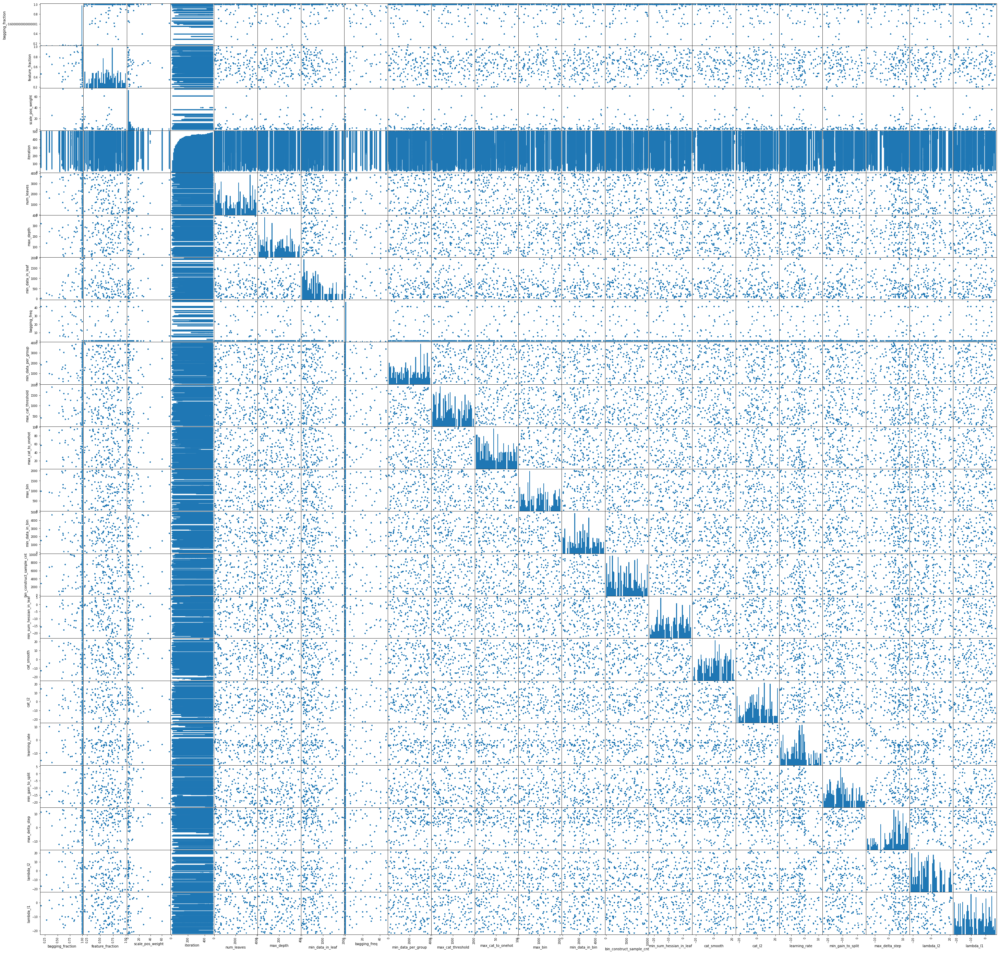

In [65]:
pd.plotting.scatter_matrix(
    pd.concat([best[CONT_PARAMETERS + INT_PARAMETERS], 
               np.log(best[list(set(LOG_PARAMETERS))])],
              axis='columns',
              sort=True
             ).rename(lambda x: x.replace('param_', ''), axis='columns'),
    alpha=0.5, figsize=(50, 50), hist_kwds={'bins': 50});

### check failures in best selected parameter range

In [51]:
best_range = best\
    [[c for c in best.columns if c.startswith('param_') and not c in SET_PARAMETERS]]\
    .drop(columns=['param_seed'])\
    .quantile([0, 1]).T
best_range

,0.0,1.0
param_bagging_fraction,1.699536e-01,1.000000e+00
param_bagging_freq,0.000000e+00,4.800000e+01
param_bin_construct_sample_cnt,2.600000e+01,9.946000e+03
param_cat_l2,1.066554e-10,7.350431e+09
param_cat_smooth,1.066710e-10,7.193027e+09
param_feature_fraction,2.003412e-01,9.984329e-01
param_lambda_l1,3.036798e-10,8.250271e+02
param_lambda_l2,1.366483e-10,4.799788e+09
param_learning_rate,1.309341e-08,1.775934e+05
param_max_bin,3.200000e+01,2.034000e+03


In [52]:
dfs = []
for f in files:
    df = pd.read_pickle(f).assign(file=f)
    for (n, l, h) in best_range.itertuples():
        df = df[(((df[n] >= l) & (df[n] <= h))
                 | df[n].isna())].copy()
    dfs.append(df)

limited = pd.concat(dfs, ignore_index=True, sort=True)
del dfs
limited.shape

(772000, 54)

In [53]:
limited_best_iteration = limited.sort_values('min_whole_validation_auc').groupby(['file', 'experiment_id']).last()
limited_best_iteration.shape

(1544, 52)

In [68]:
limited_best_iteration['param_bagging_enable'] = (limited_best_iteration.param_bagging_freq == 0)

In [54]:
limited_best_iteration.min_whole_validation_auc.describe()

count    1544.000000
mean        0.621616
std         0.120564
min         0.493961
25%         0.500000
50%         0.634350
75%         0.744024
max         0.810748
Name: min_whole_validation_auc, dtype: float64

In [69]:
limited_bad = limited_best_iteration[limited_best_iteration.min_whole_validation_auc < 0.6]

In [70]:
limited_bad.shape

(740, 53)

TODO pikachu with bruises reaction

In [71]:
limited_bad.groupby(SET_PARAMETERS).size()

param_is_unbalance  param_boost_from_average
False               False                       207
                    True                        206
True                False                       131
                    True                        196
dtype: int64

In [73]:
limited_bad.groupby('param_bagging_enable').size()

param_bagging_enable
False    440
True     300
dtype: int64

In [58]:
limited_best_iteration.groupby(SET_PARAMETERS).min_whole_validation_auc.describe()

count      mean       std  \
param_is_unbalance param_boost_from_average                              
False              False                     353.0  0.598038  0.116744   
                   True                      360.0  0.597940  0.116662   
True               False                     426.0  0.665223  0.115711   
                   True                      405.0  0.617344  0.120223   

                                                  min  25%       50%  \
param_is_unbalance param_boost_from_average                            
False              False                     0.500000  0.5  0.500000   
                   True                      0.500000  0.5  0.500000   
True               False                     0.493961  0.5  0.710409   
                   True                      0.500000  0.5  0.641056   

                                                  75%       max  
param_is_unbalance param_boost_from_average                      
False              False                     0.714870  0.809088  
                   True                      0.718982  0.809303  
True               False                     0.763363  0.810748  
                   True                      0.746028  0.808386

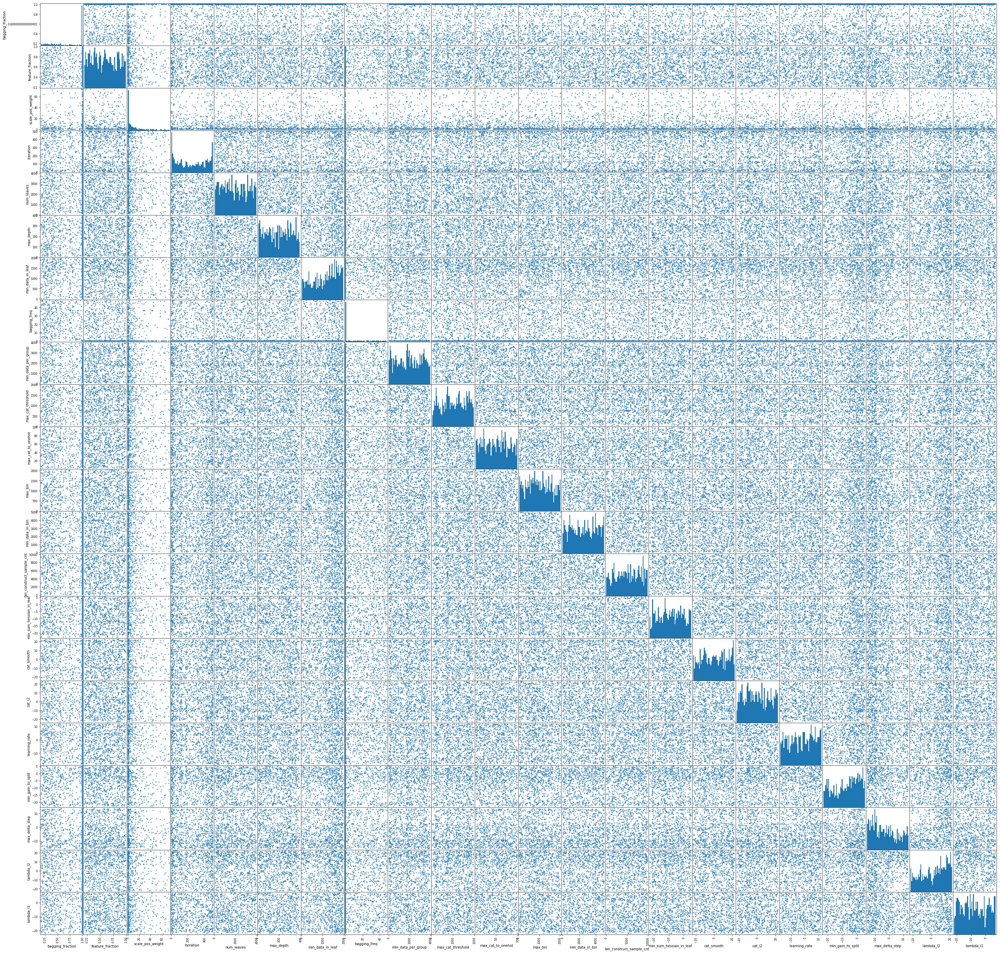

In [59]:
pd.plotting.scatter_matrix(
    pd.concat([limited_bad[CONT_PARAMETERS + INT_PARAMETERS], 
               np.log(limited_bad[list(set(LOG_PARAMETERS))])],
              axis='columns',
              sort=True
             ).rename(lambda x: x.replace('param_', ''), axis='columns'),
    alpha=0.8, figsize=(50, 50), hist_kwds={'bins': 50});

### single best parameter set

In [60]:
single_best = best.iloc[0]

In [61]:
with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    print(single_best)

experiment_id                                                          621
file                                    ./experiments/bagging-switch-1.pkl
iteration                                                              394
max_dev_auc                                                       0.854533
max_dev_binary_logloss                                            0.524914
max_validation_auc                                                0.810747
max_validation_binary_logloss                                     0.540627
max_whole_train_auc                                               0.835364
max_whole_train_binary_logloss                                    0.507665
max_whole_validation_auc                                          0.809995
max_whole_validation_binary_logloss                               0.538572
mean_dev_auc                                                      0.831545
mean_dev_binary_logloss                                            0.51219
mean_train_auc           

In [62]:
# todo generate 1% neighborhood around best parameter set

In [63]:
second_best = best.iloc[1]

In [64]:
with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    print(second_best)

experiment_id                                                          621
file                                    ./experiments/bagging-switch-1.pkl
iteration                                                              391
max_dev_auc                                                       0.854574
max_dev_binary_logloss                                            0.524993
max_validation_auc                                                0.810836
max_validation_binary_logloss                                     0.540628
max_whole_train_auc                                               0.835294
max_whole_train_binary_logloss                                    0.507825
max_whole_validation_auc                                          0.810025
max_whole_validation_binary_logloss                               0.538623
mean_dev_auc                                                      0.831544
mean_dev_binary_logloss                                           0.512322
mean_train_auc           